<a href="https://colab.research.google.com/github/luongvantuit/learn-ai-with-python/blob/master/cnn/VD1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install tensorflow==2.12.0

In [2]:
from google.colab import drive

drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
import zipfile

file_zip = "/content/drive/My Drive/Machine Learning/CNN/cats_and_dogs_filtered.zip"

zip_ref = zipfile.ZipFile(file_zip, "r")
zip_ref.extractall("/tmp/cats_and_dogs")

zip_ref.close()

In [4]:
!ls -al /tmp/cats_and_dogs/

total 12
drwxr-xr-x 3 root root 4096 Nov  4 15:27 .
drwxrwxrwt 1 root root 4096 Nov  4 16:14 ..
drwxr-xr-x 4 root root 4096 Nov  4 15:27 cats_and_dogs_filtered


Contents of base directory:
['train', 'validation', 'vectorize.py']

Contents of train directory:
['dogs', 'cats']

Contents of validation directory:
['dogs', 'cats']
['cat.413.jpg', 'cat.19.jpg', 'cat.624.jpg', 'cat.970.jpg', 'cat.679.jpg', 'cat.364.jpg', 'cat.357.jpg', 'cat.667.jpg', 'cat.373.jpg', 'cat.779.jpg']
['dog.860.jpg', 'dog.29.jpg', 'dog.248.jpg', 'dog.268.jpg', 'dog.530.jpg', 'dog.112.jpg', 'dog.64.jpg', 'dog.599.jpg', 'dog.477.jpg', 'dog.962.jpg']
total training cat images : 1000
total training dog images : 1000
total validation cat images : 500
total validation dog images : 500


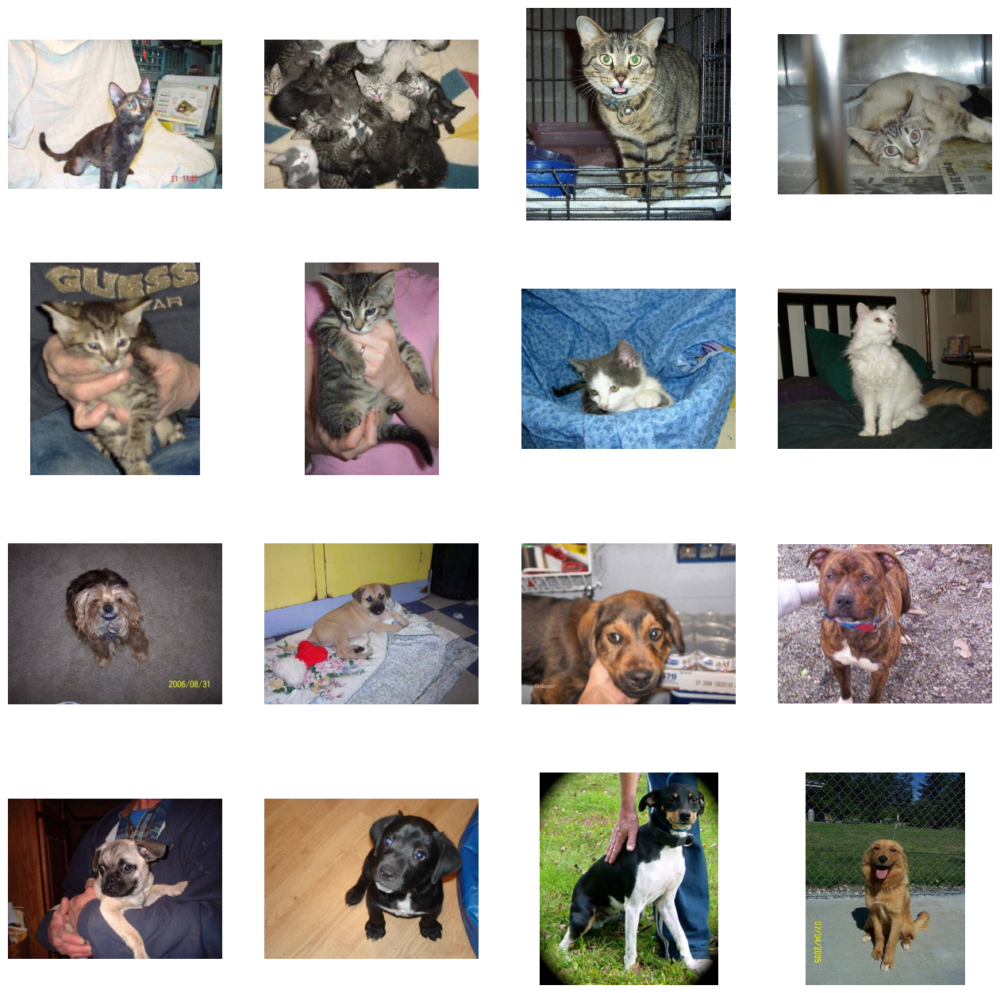

In [5]:
import os
from pathlib import Path

base_dir = Path("/tmp/cats_and_dogs/cats_and_dogs_filtered")
print("Contents of base directory:")
print(os.listdir(base_dir))

print("\nContents of train directory:")
print(os.listdir(base_dir/"train"))
print("\nContents of validation directory:")
print(os.listdir(base_dir/"validation"))

train_dir = base_dir/"train"
validation_dir = base_dir/"validation"

# Directory with training cat/dog pictures
train_cats_dir = train_dir/'cats'
train_dogs_dir = train_dir/'dogs'

# Directory with validation cat/dog pictures
validation_cats_dir = validation_dir/'cats'
validation_dogs_dir = validation_dir/'dogs'


train_cat_fnames = os.listdir(train_cats_dir)
train_dog_fnames = os.listdir(train_dogs_dir)

print(train_cat_fnames[:10])
print(train_dog_fnames[:10])


print('total training cat images :', len(os.listdir( train_cats_dir ) ))
print('total training dog images :', len(os.listdir( train_dogs_dir ) ))
print('total validation cat images :', len(os.listdir( validation_cats_dir ) ))
print('total validation dog images :', len(os.listdir( validation_dogs_dir ) ))

%matplotlib inline
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
# Parameters for our graph; we'll output images in a 4x4 configuration
nrows = 4
ncols = 4
pic_index = 0 # Index for iterating over images
# Set up matplotlib fig, and size it to fit 4x4 pics
fig = plt.gcf()
fig.set_size_inches(ncols*4, nrows*4)
pic_index+=8
next_cat_pix = [os.path.join(train_cats_dir, fname)
            for fname in train_cat_fnames[ pic_index-8:pic_index]
]
next_dog_pix = [os.path.join(train_dogs_dir, fname)
for fname in train_dog_fnames[ pic_index-8:pic_index]
]
for i, img_path in enumerate(next_cat_pix+next_dog_pix):
  # Set up subplot; subplot indices start at 1
  sp = plt.subplot(nrows, ncols, i + 1)
  sp.axis('Off') # Don't show axes (or gridlines)
  img = mpimg.imread(img_path)
  plt.imshow(img)
plt.show()



In [6]:
import tensorflow as tf
model = tf.keras.models.Sequential([
  # Note the input shape is the desired size of the image 150x150 with 3 bytes color
  tf.keras.layers.Conv2D(16, (3,3), activation='relu', input_shape=(150, 150, 3)),
  tf.keras.layers.MaxPooling2D(2,2),
  tf.keras.layers.Conv2D(32, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2,2),
  tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2,2),
  # Flatten the results to feed into a DNN
  tf.keras.layers.Flatten(),
  # 512 neuron hidden layer
  tf.keras.layers.Dense(512, activation='relu'),
  # Only 1 output neuron.
  # It will contain a value from 0-1 where 0 for 1 class ('cats')
  # and 1 for the other ('dogs')
  tf.keras.layers.Dense(1, activation='sigmoid')
])

from tensorflow.keras.optimizers import RMSprop
model.compile(optimizer=RMSprop(learning_rate=0.001),
  loss='binary_crossentropy',
  metrics = ['accuracy'])

from tensorflow.keras.preprocessing.image import ImageDataGenerator
# All images will be rescaled by 1./255.
train_datagen = ImageDataGenerator( rescale = 1.0/255. )
test_datagen = ImageDataGenerator( rescale = 1.0/255. )
# --------------------
# Flow training images in batches of 20 using train_datagen generator
# --------------------
train_generator = train_datagen.flow_from_directory(train_dir,
  batch_size=20,
  class_mode='binary',
  target_size=(150, 150))
# --------------------
# Flow validation images in batches of 20 using test_datagen generator
# --------------------
validation_generator = test_datagen.flow_from_directory(validation_dir,
  batch_size=20,
  class_mode = 'binary',
  target_size = (150,
  150))

history = model.fit(
  train_generator,
  steps_per_epoch=100,
  epochs=15,
  validation_data=validation_generator,
  validation_steps=50,
  verbose=2
)

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.
Epoch 1/15
100/100 - 77s - loss: 1.0556 - accuracy: 0.5390 - val_loss: 0.6762 - val_accuracy: 0.5740 - 77s/epoch - 767ms/step
Epoch 2/15
100/100 - 77s - loss: 0.6729 - accuracy: 0.6065 - val_loss: 0.6052 - val_accuracy: 0.6690 - 77s/epoch - 765ms/step
Epoch 3/15
100/100 - 75s - loss: 0.5927 - accuracy: 0.7000 - val_loss: 0.5894 - val_accuracy: 0.6820 - 75s/epoch - 747ms/step
Epoch 4/15
100/100 - 75s - loss: 0.5450 - accuracy: 0.7380 - val_loss: 0.5777 - val_accuracy: 0.6930 - 75s/epoch - 746ms/step
Epoch 5/15
100/100 - 74s - loss: 0.4837 - accuracy: 0.7645 - val_loss: 0.5620 - val_accuracy: 0.7130 - 74s/epoch - 740ms/step
Epoch 6/15
100/100 - 82s - loss: 0.4279 - accuracy: 0.7925 - val_loss: 0.5887 - val_accuracy: 0.7210 - 82s/epoch - 820ms/step
Epoch 7/15
100/100 - 71s - loss: 0.3425 - accuracy: 0.8445 - val_loss: 0.6568 - val_accuracy: 0.7110 - 71s/epoch - 712ms/step
Epoch 8/15
100/100 - 79s - loss: 0

1/1 [==============================] - 0s 187ms/step


<ipython-input-7-b4138ba09356>:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure( figsize=(scale * n_features, scale) )
<ipython-input-7-b4138ba09356>:44: RuntimeWarning: invalid value encountered in divide
  x /= x.std()


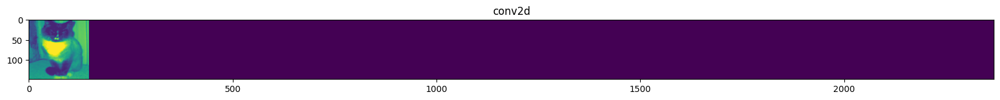

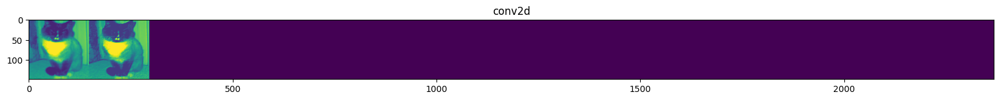

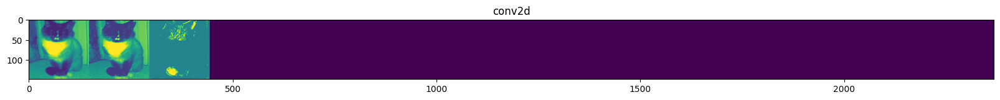

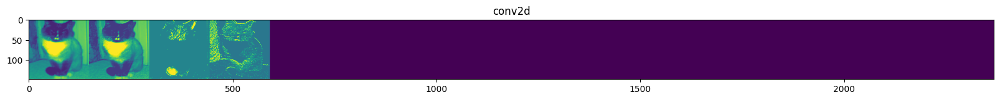

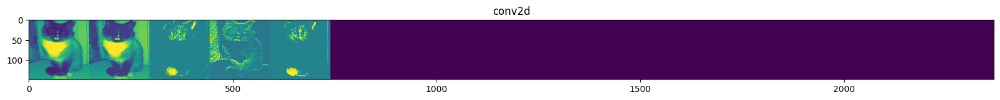

...

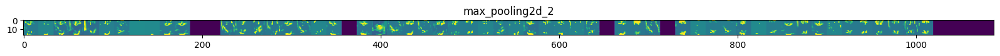

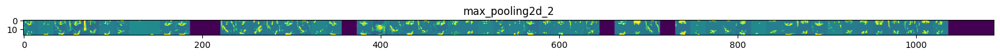

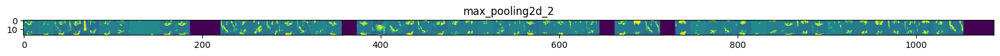

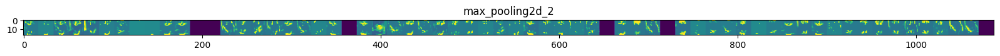

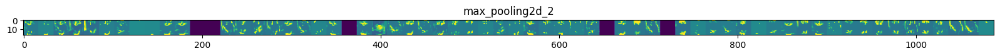

In [7]:
import numpy as np
import random
import matplotlib.pyplot as plt

from tensorflow.keras.preprocessing.image import img_to_array, load_img
# Define a new Model that will take an image as input, and will output
# intermediate representations for all layers in the previous model
successive_outputs = [layer.output for layer in model.layers]
visualization_model = tf.keras.models.Model(inputs = model.input, outputs =
successive_outputs)
# Prepare a random input image from the training set.
cat_img_files = [os.path.join(train_cats_dir, f) for f in train_cat_fnames]
dog_img_files = [os.path.join(train_dogs_dir, f) for f in train_dog_fnames]
img_path = random.choice(cat_img_files + dog_img_files)
img = load_img(img_path, target_size=(150, 150)) # this is a PIL image
x = img_to_array(img) # Numpy array with shape (150, 150, 3)
x = x.reshape((1,) + x.shape) # Numpy array with shape (1, 150, 150, 3)
# Scale by 1/255
x /= 255.0
# Run the image through the network, thus obtaining all
# intermediate representations for this image.
successive_feature_maps = visualization_model.predict(x)
# These are the names of the layers, so we can have them as part of our plot

plt.close('all')

layer_names = [layer.name for layer in model.layers]
# Display the representations
for layer_name, feature_map in zip(layer_names, successive_feature_maps):
  if len(feature_map.shape) == 4:
    #-------------------------------------------
    # Just do this for the conv / maxpool layers, not the fully-connected layers
    #-------------------------------------------
    n_features = feature_map.shape[-1] # number of features in the feature map
    size = feature_map.shape[ 1] # feature map shape (1, size, size, n_features)
    # Tile the images in this matrix
    display_grid = np.zeros((size, size * n_features))
    #-------------------------------------------------
    # Postprocess the feature to be visually palatable
    #-------------------------------------------------
    for i in range(n_features):
      x = feature_map[0, :, :, i]
      x -= x.mean()
      x /= x.std()
      x *= 64
      x += 128
      x = np.clip(x, 0, 255).astype('uint8')
      display_grid[:, i * size : (i + 1) * size] = x # Tile each filter into a horizontal grid
      #-----------------
      # Display the grid
      #-----------------
      scale = 20. / n_features
      plt.figure( figsize=(scale * n_features, scale) )
      plt.title ( layer_name )
      plt.grid ( False )
      plt.imshow( display_grid, aspect='auto', cmap='viridis' )


1/1 [==============================] - 0s 151ms/step
[1.]
dogs/dog.2000.jpg is a dog


Text(0.5, 1.0, 'Training and validation loss')

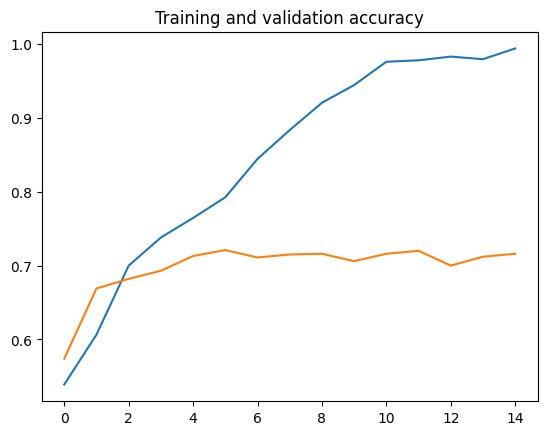

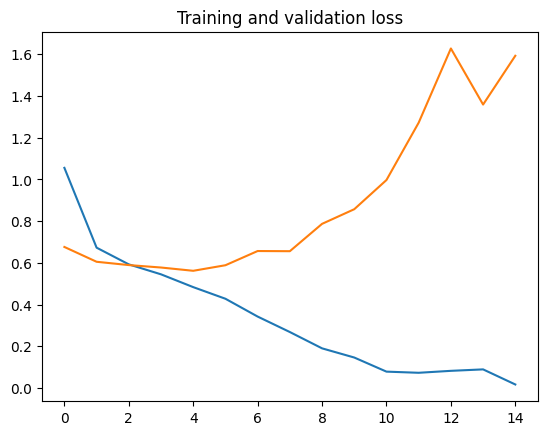

In [8]:
import numpy as np
#from google.colab import files
from tensorflow.keras.preprocessing.image import img_to_array, load_img
#uploaded=files.upload()
#for fn in uploaded.keys():
fn = 'dogs/dog.2000.jpg' # change it to your image file
# predicting images
path=validation_dir/'dogs/dog.2000.jpg' # change it to your image
img=load_img(path, target_size=(150, 150))
x=img_to_array(img)
x /= 255
x=np.expand_dims(x, axis=0)
images = np.vstack([x])

classes = model.predict(images, batch_size=10)
print(classes[0])
if classes[0]>0.5:
  print(fn + " is a dog" )
else:
  print(fn + " is a cat" )

#-----------------------------------------------------------
# Retrieve a list of list results on training and test data
# sets for each training epoch
#-----------------------------------------------------------
acc = history.history[ 'accuracy' ]
val_acc = history.history[ 'val_accuracy' ]
loss = history.history[ 'loss' ]
val_loss = history.history['val_loss' ]
epochs = range(len(acc)) # Get number of epochs
#------------------------------------------------
# Plot training and validation accuracy per epoch
#------------------------------------------------
plt.plot ( epochs, acc )
plt.plot ( epochs, val_acc )
plt.title ('Training and validation accuracy')
plt.figure()
#------------------------------------------------
# Plot training and validation loss per epoch
#------------------------------------------------
plt.plot ( epochs, loss )
plt.plot ( epochs, val_loss )
plt.title ('Training and validation loss' )